# Code pour illustrer les graphs

In [1]:
from matplotlib import pyplot as plt
import networkx as nx
import pandas as pd
import numpy as np

PATH = "../dataframes/results" # chemin vers les DataFrames

***Import des données***

In [2]:
col = [["point_1", "point_1", "point_1", "point_2", "point_2", "point_2", "duree (min)", "distance (km)", 
        "empreinte carbone (gCO2)", "prix (euros)"],
       ["nom", "latitude", "longitude", "nom", "latitude", "longitude", "", "", "", ""]]
col = pd.MultiIndex.from_arrays(col)

df_bus = pd.read_csv(f"{PATH}/df_bus.csv", sep=",", header=1, names = col)
df_avions = pd.read_csv(f"{PATH}/df_avions.csv", sep=",", header=1, names = col)
df_tgv = pd.read_csv(f"{PATH}/df_tgv.csv", sep=",", header=1, names = col)
df_intercites = pd.read_csv(f"{PATH}/df_intercites.csv", sep=",", header=1, names = col)
df_ter = pd.read_csv(f"{PATH}/df_ter.csv", sep=",", header=1, names = col)

***Fonctions***

In [3]:
def graph(df: object, transport: str) -> object: # qd avions a les empreintes carbones on fait put weigth direct in
    """
    Retourne le graph définie par le dataframe df ou :
     -> Les noeuds sont définis "nom"
        Les attribus du noeud sont "latitude" et "longitude"
     -> Les arretes sont définis ("nom", "point1") et ("point2", "nom")
        Les attribus de l'arrete sont "duree (min)", "distance (km)", "empreinte carbone (gCO2)" et "prix (euros)"
    """
    G = nx.Graph()
    dic_point_pos = {}
    for point1, lat1, long1, point2, lat2, long2 in df[[("point_1", "nom"), ("point_1", "latitude"), 
                                                        ("point_1", "longitude"), ("point_2", "nom"), 
                                                        ("point_2", "latitude"), ("point_2", "longitude")]].values:
        dic_point_pos[point1] = (round(lat1, 5), round(long1, 5))
        dic_point_pos[point2] = (round(lat2, 5), round(long2, 5))

    for node, lat_long in dic_point_pos.items():
        G.add_node(node, latitude=lat_long[0], longitude=lat_long[1])

    dic_point1_point2_attrib = {}
    for point1, point2, duree, distance, empreinte_carbone, prix in df[[("point_1", "nom"), ("point_2", "nom"), 
                                                   ("duree (min)", ""), ("distance (km)", ""), 
                                                   ("empreinte carbone (gCO2)", ""), ("prix (euros)", "")]].values:
        dic_point1_point2_attrib[(point1, point2)] = (duree, distance, empreinte_carbone, prix)

    for points, attrib in dic_point1_point2_attrib.items():
        G.add_edge(points[0], points[1], duree=round(attrib[0], 2), distance=round(attrib[1], 2), 
                   empreinte_carbone=round(attrib[2], 2), prix=round(attrib[3], 2), transport=transport)

    return G

def merge_graph(Graphs: list) -> object:
    """
    Combine les différents graphs en un gros graph de manière disjointe. Les noms des noeuds se transforment en
    numéro unique
    """
    G = nx.Graph()
    for G_temp in Graphs:
        G = nx.disjoint_union(G, G_temp)
    return G

def mins_maxs(edges_data: list) -> list:
    """
    Calcul les attributs minimums et maximums des edges (on ne s'intéresse pas à l'attribut "transport")
    """
    maxs, mins = {}, {}
    for attrib in edges_data:
        for key, value in attrib[2].items():
            if value != str(value):
                if maxs.get(key, 0) < value:
                    maxs[key] = value
                if mins.get(key, 1e12) > value:
                    mins[key] = value
    return [maxs, mins]

def ecart(lat_i: float, lat_f: float, long_i: float, long_f: float):
    """
    Calcul de la distance entre deux points gps par la formule de Haversine
    """
    r = 6378
    lat_i, long_i = math.radians(lat_i), math.radians(long_i)
    lat_f, long_f = math.radians(lat_f), math.radians(long_f)
    return 2*r*math.asin(math.sqrt(math.sin((lat_i - lat_f)/2)**2 + math.cos(lat_i)*
                                   math.cos(lat_f)*math.sin((long_i-long_f)/2)**2))

def put_weight(G: object, duree: int=10, distance: int=1, empreinte_carbone: int=1, prix: int=1) -> object:
    """
    Définit les poids des arrêtes du graph G par rapport aux 4 attributs qui nous intéressent
    Par défaut on a duree=10, distance=1, empreinte_carbone=1 et prix=1
    """
    maxs, mins = mins_maxs(list(G.edges.data()))
    for edge in G.edges():
        attribs = list(G.get_edge_data(*edge).values())
        weight = duree*(attribs[0]-mins["duree"])/(maxs["duree"]-mins["duree"]) + \
                 distance*(attribs[1]-mins["distance"])/(maxs["distance"]-mins["distance"]) + \
                 empreinte_carbone*(attribs[2]-mins["empreinte_carbone"])/(maxs["empreinte_carbone"]-
                                                                           mins["empreinte_carbone"]) + \
                 prix*(attribs[3]-mins["prix"])/(maxs["prix"]-mins["prix"])
        G[edge[0]][edge[1]]['weight'] = weight/(duree + distance + empreinte_carbone + prix)
    return G

def plot_graph(G: object, plot: dict={"shell": True, "networkx": True}, size_node: float=1):
    """
    Affiche le plot du graph G :
     -> shell (False == pas affiché)
     -> networkx (False == pas affiché)
    Option de taille des noeuds par défaut à 1
    """
    pos = {}
    pos_lat, pos_long = nx.get_node_attributes(G, "latitude"), nx.get_node_attributes(G, "longitude")
    for key in pos_lat.keys():
        pos[key] = (pos_long[key], pos_lat[key])
    weight = np.array(list(nx.get_edge_attributes(G, 'weight').values()))
    if len(weight) != 0:
        weight = weight/sum(weight)
        max_weight = weight.max()
    else:
        weight = np.array([1/5 for e in range(len(G.edges()))])
        max_weight = 1
    for i in range(len(weight)):
        min_weight = min(weight[weight!=0])
        if weight[i] == 0:
            weight[i] = min_weight/100
    connexions = [v*size_node*100 for v in list(dict(G.degree).values())]
    if plot["shell"] == True:
        plt.figure(figsize=(16, 14))
        nx.draw_shell(G, width=5*weight/max_weight, node_size=connexions, alpha=0.8, node_color=connexions, 
                      cmap="jet", edge_cmap=plt.cm.get_cmap("jet"), edge_color=weight, with_labels=False, 
                      font_size=10)
        plt.show()
    if plot["networkx"] == True:
        plt.figure(figsize=(16, 14))
        nx.draw(G, pos, width=5*weight/max_weight, node_size=connexions, alpha=0.8, node_color=connexions, 
                cmap="jet", edge_cmap=plt.cm.get_cmap("jet"), edge_color=weight, with_labels=False, font_size=10)
        plt.show()

***Graph bus***

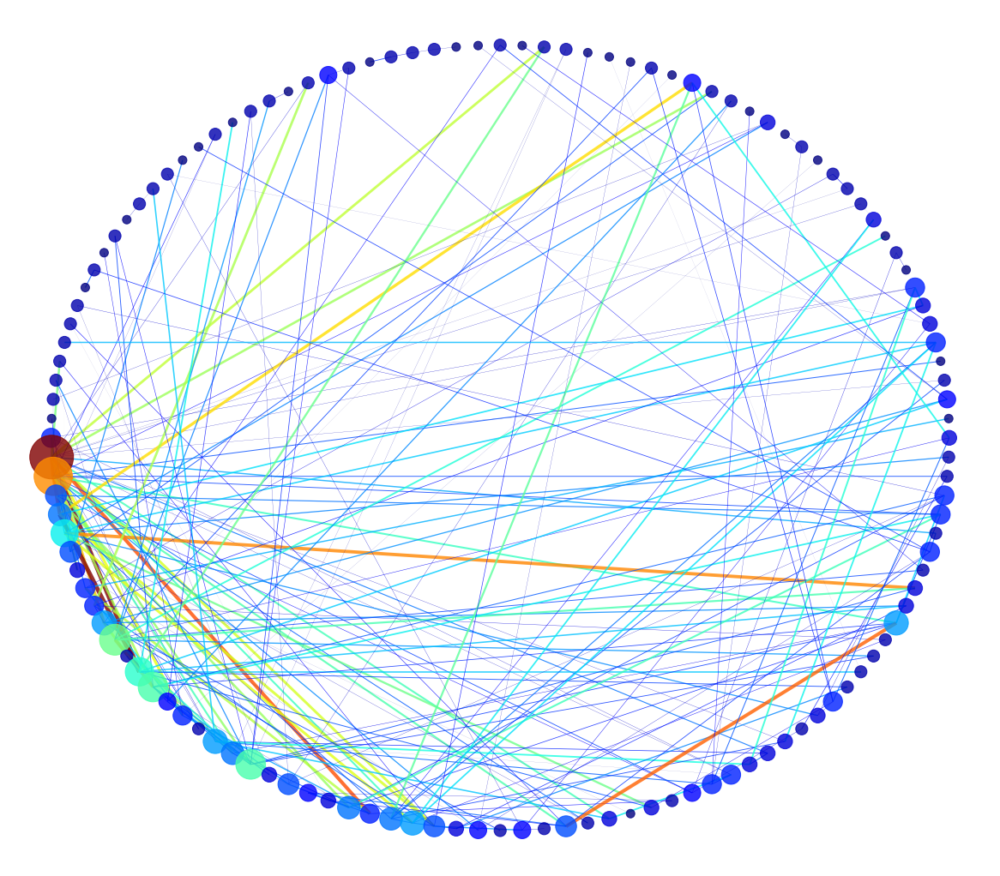

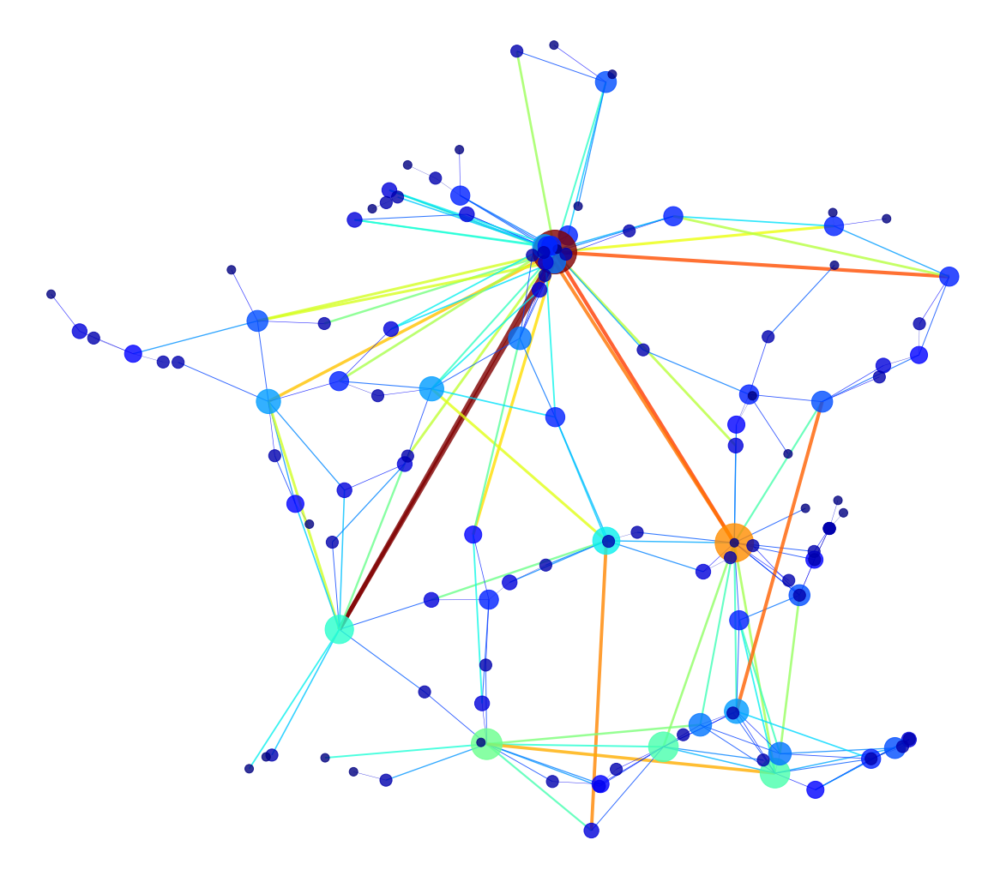

CPU times: user 620 ms, sys: 269 ms, total: 889 ms
Wall time: 404 ms


In [4]:
%%time
G_bus = graph(df_bus, "bus")
G_bus = put_weight(G_bus)
plot_graph(G_bus) # mettre poids avant de plot (cellule du dessus)

***Graph avions***

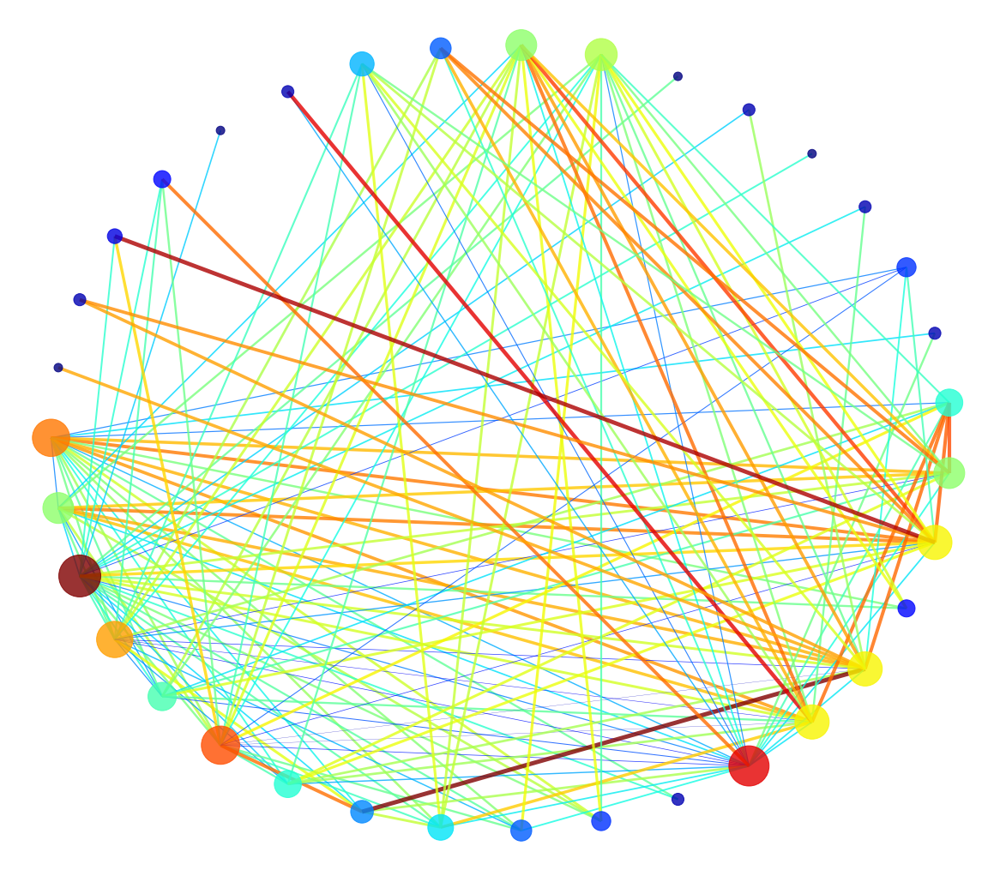

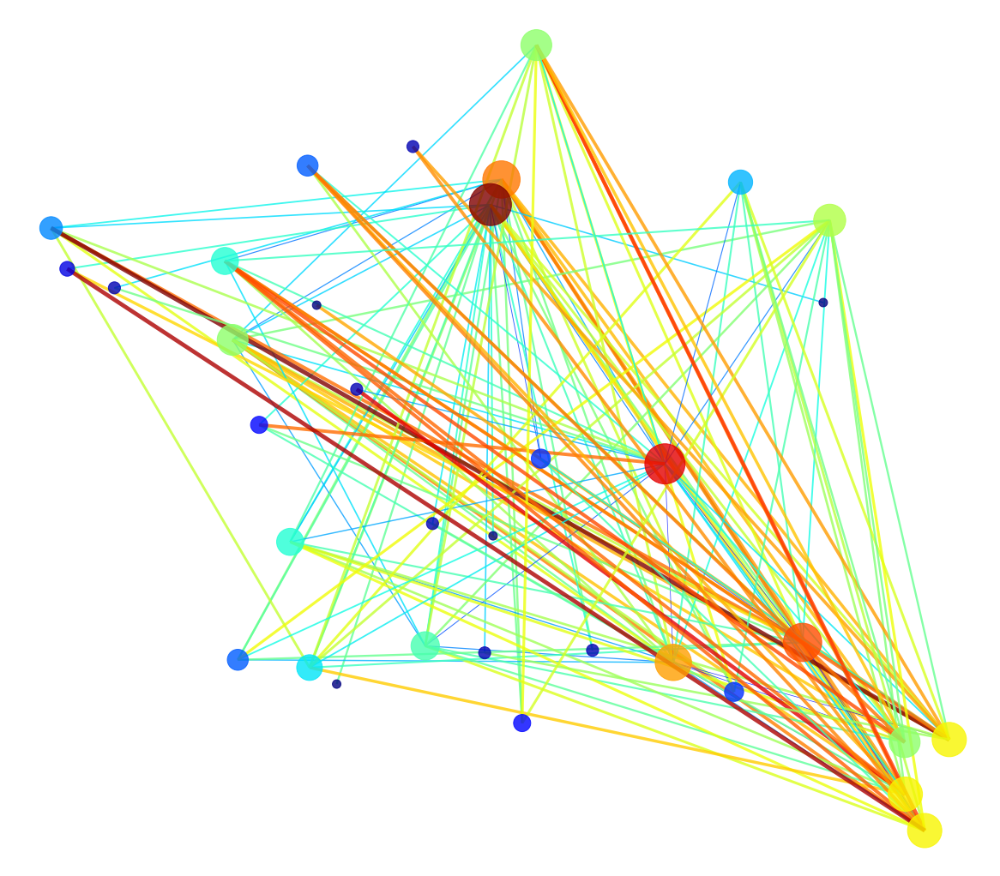

CPU times: user 675 ms, sys: 283 ms, total: 958 ms
Wall time: 467 ms


In [5]:
%%time
G_avions = graph(df_avions, "avions")
G_avions = put_weight(G_avions)
plot_graph(G_avions) # on voit bien qu'il y a la Corse en plus

***Graph TGV***

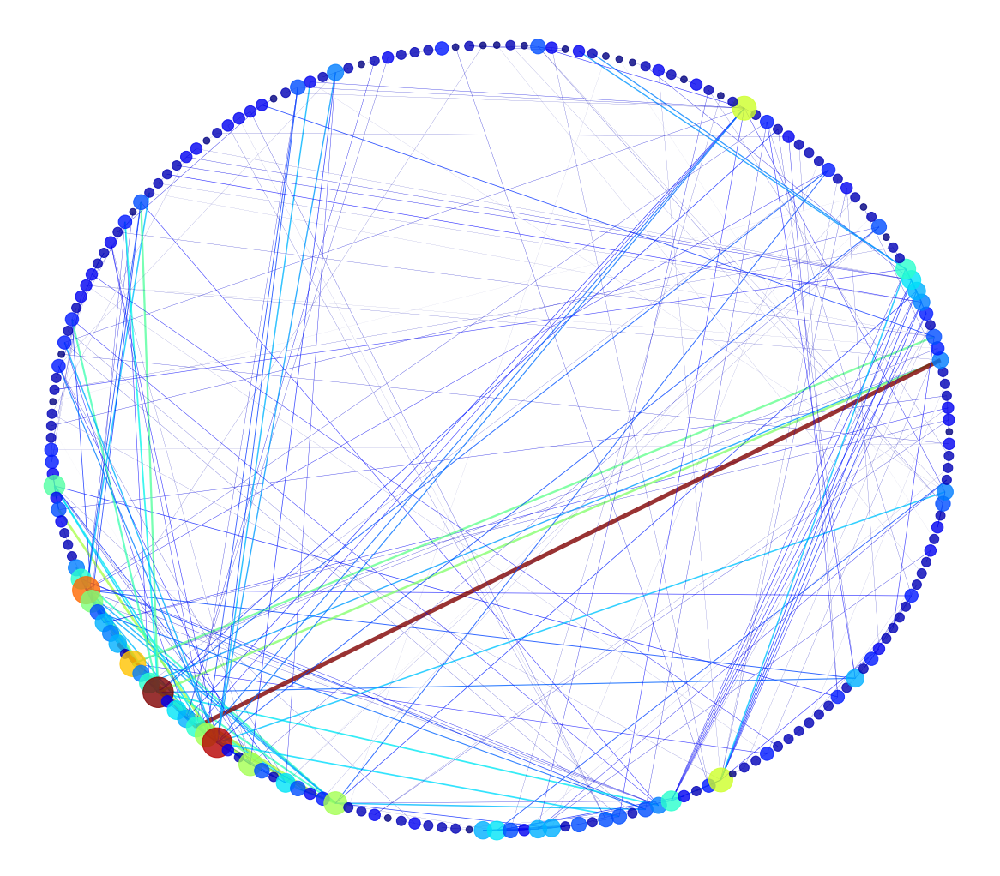

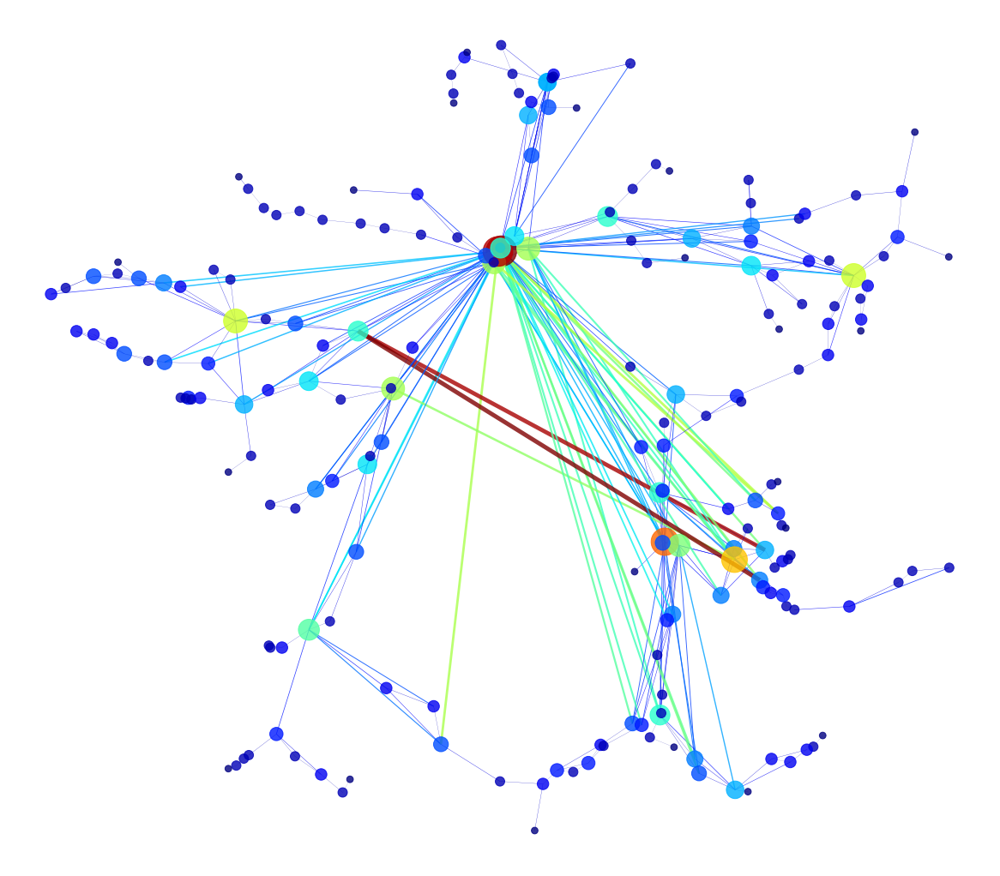

CPU times: user 710 ms, sys: 269 ms, total: 979 ms
Wall time: 487 ms


In [6]:
%%time
G_tgv = graph(df_tgv, "tgv")
G_tgv = put_weight(G_tgv)
plot_graph(G_tgv, size_node = 0.6) # mettre poids avant de plot (cellule du dessus)

***Graph intercités***

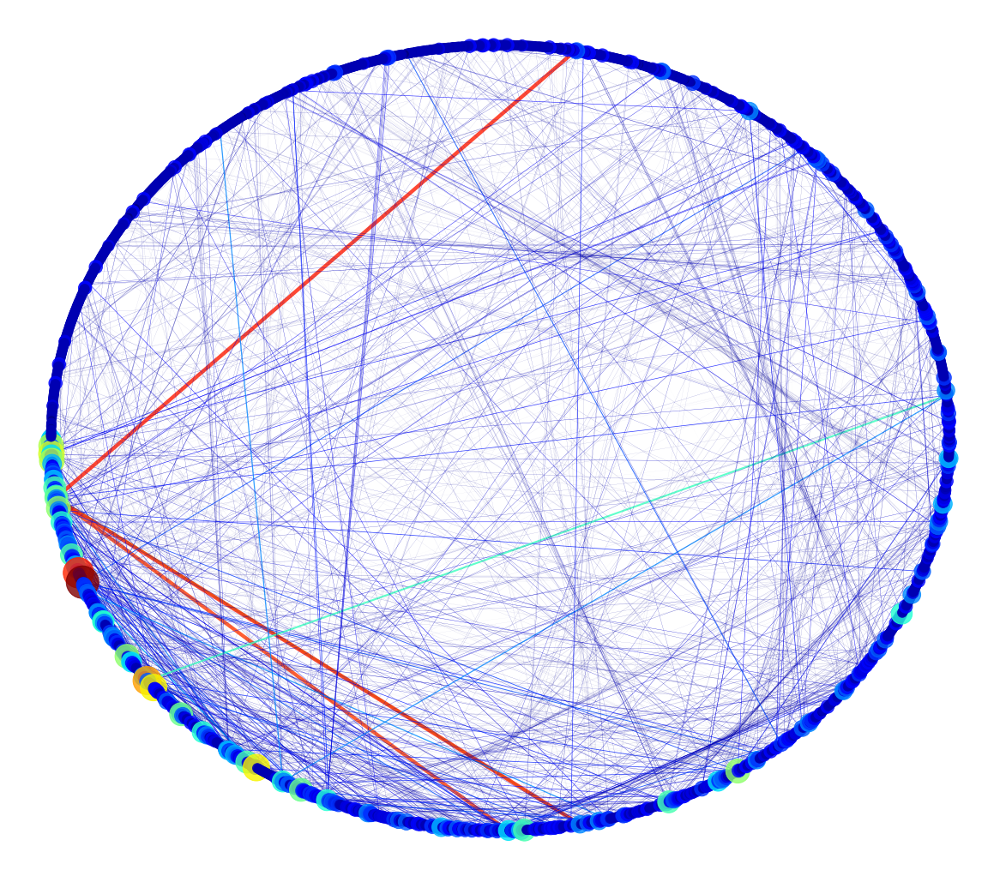

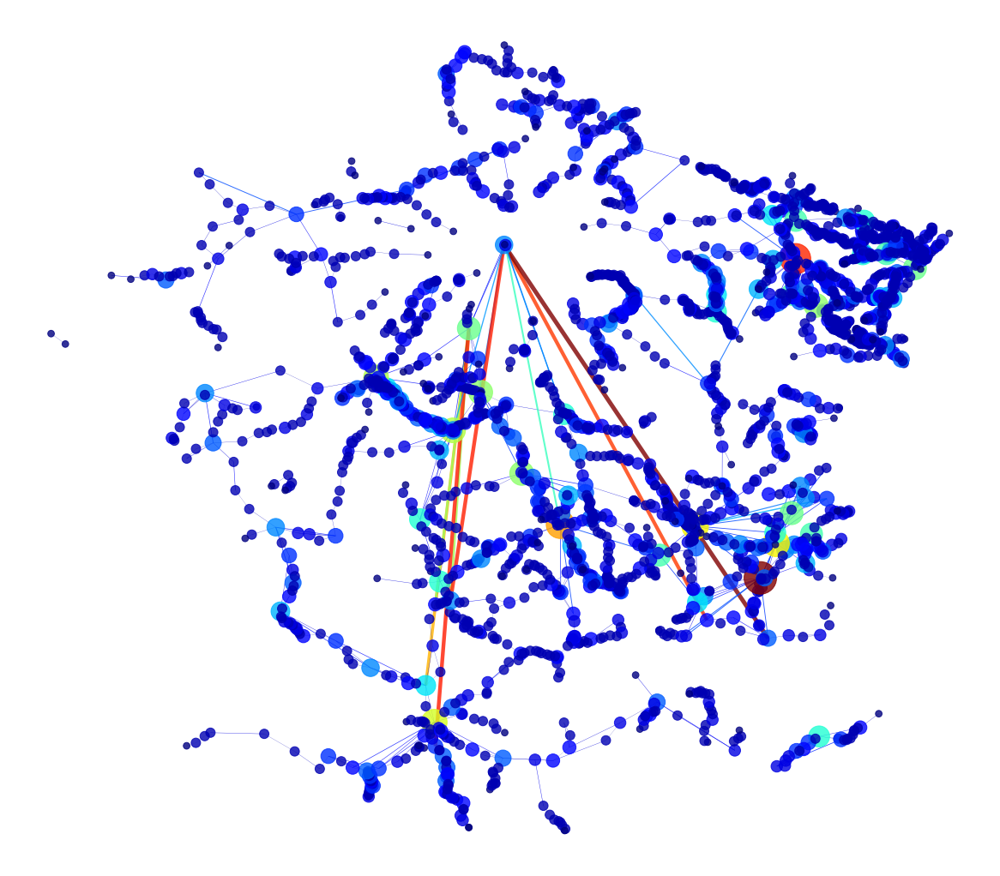

CPU times: user 2.77 s, sys: 201 ms, total: 2.97 s
Wall time: 2.48 s


In [7]:
%%time
G_intercites = graph(df_intercites, "intercites")
G_intercites = put_weight(G_intercites)
plot_graph(G_intercites, size_node = 0.6) # mettre poids avant de plot (cellule du dessus)

***Graph ter***

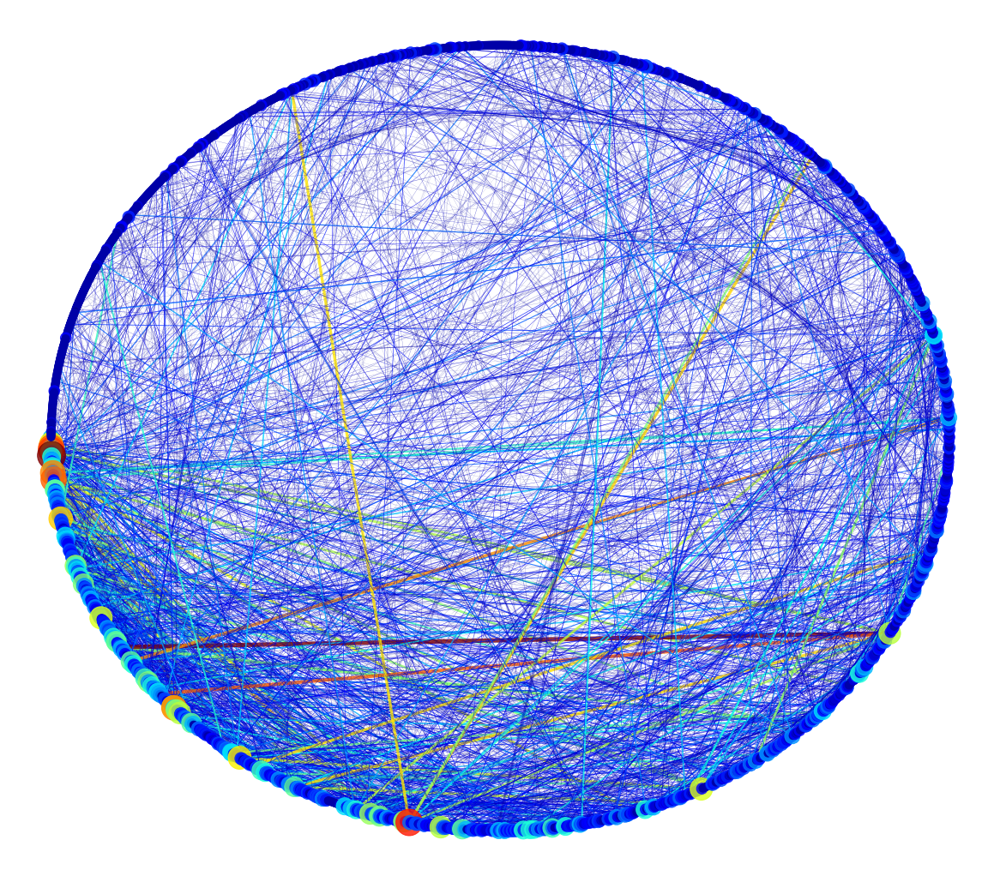

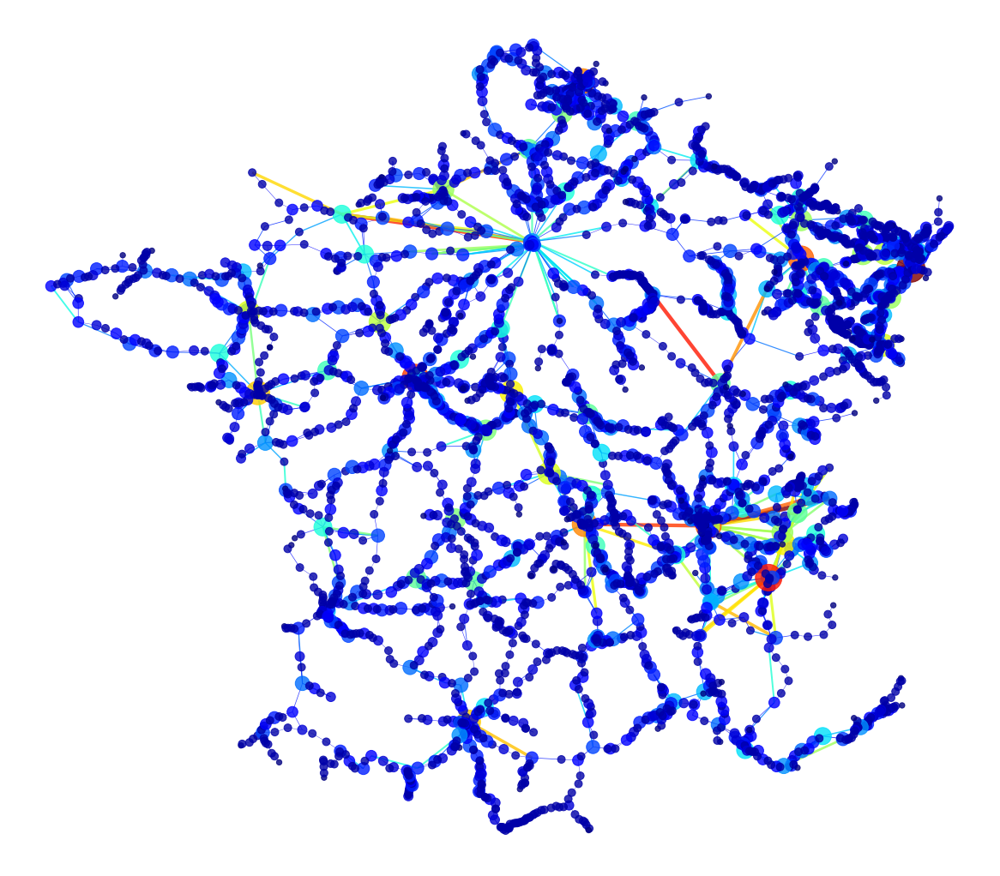

CPU times: user 5.11 s, sys: 291 ms, total: 5.4 s
Wall time: 4.95 s


In [8]:
%%time
G_ter = graph(df_ter, "ter")
G_ter = put_weight(G_ter)
plot_graph(G_ter, size_node=0.4) # mettre poids avant de plot (cellule du dessus)

***Mix des df pour graph global***

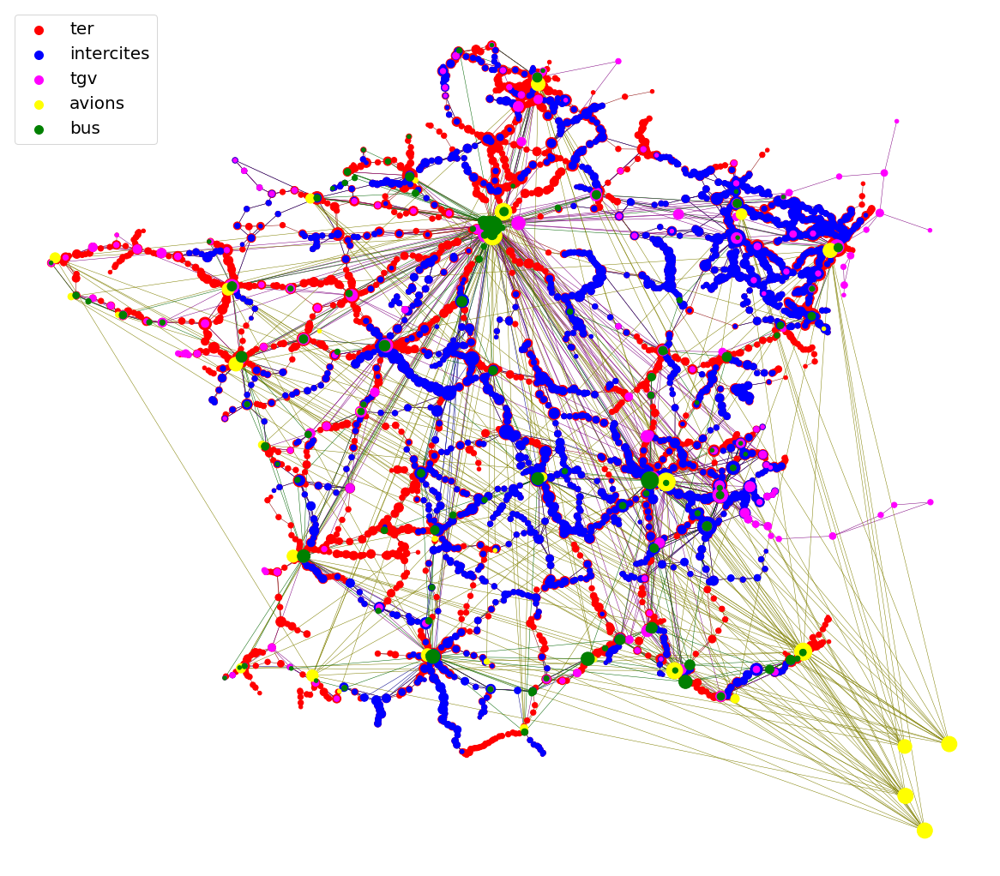

In [9]:
pos_bus, pos_avions, pos_tgv, pos_intercites, pos_ter = {}, {}, {}, {}, {}
for dic, graph in zip([pos_bus, pos_avions, pos_tgv, pos_intercites, pos_ter],[G_bus, G_avions, G_tgv, 
                                                                               G_intercites, G_ter]):
    pos_lat = nx.get_node_attributes(graph, "latitude")
    pos_long = nx.get_node_attributes(graph, "longitude")
    for key in pos_lat.keys():
        dic[key] = (pos_long[key], pos_lat[key])
labels = nx.get_edge_attributes(G_ter, 'weight')
weight = np.array(list(labels.values()))
weight = weight/sum(weight)
d_bus, d_avions, d_tgv, d_intercites, d_ter = dict(G_bus.degree).values(), dict(G_avions.degree).values(), \
                       dict(G_tgv.degree).values(), dict(G_intercites.degree).values(), dict(G_ter.degree).values()
plt.figure(figsize=(16,14))
nx.draw(G_ter, pos_ter, width=0.5, node_color='red', edge_color="darkred", node_size=[v*20 for v in d_ter])
nx.draw(G_intercites, pos_intercites, width=0.5, node_color='blue', edge_color="darkblue", 
        node_size=[v*20 for v in d_intercites])
nx.draw(G_tgv, pos_tgv, width=0.5, node_color='magenta', edge_color="purple", node_size=[v*20 for v in d_tgv])
nx.draw(G_avions, pos_avions, width=0.5, node_color='yellow', edge_color="olive", node_size=[v*20 for v in d_avions])
nx.draw(G_bus, pos_bus, width=0.5, node_color='green', edge_color="darkgreen", node_size=[v*20 for v in d_bus])
for color, label in zip(["red", 'blue', 'magenta', 'yellow', 'green'], ["ter", "intercites", "tgv", "avions", "bus"]):
    plt.scatter([2.31989], [48.84063],s=100,color=color,label=label)
plt.legend(fontsize=20)
plt.show()

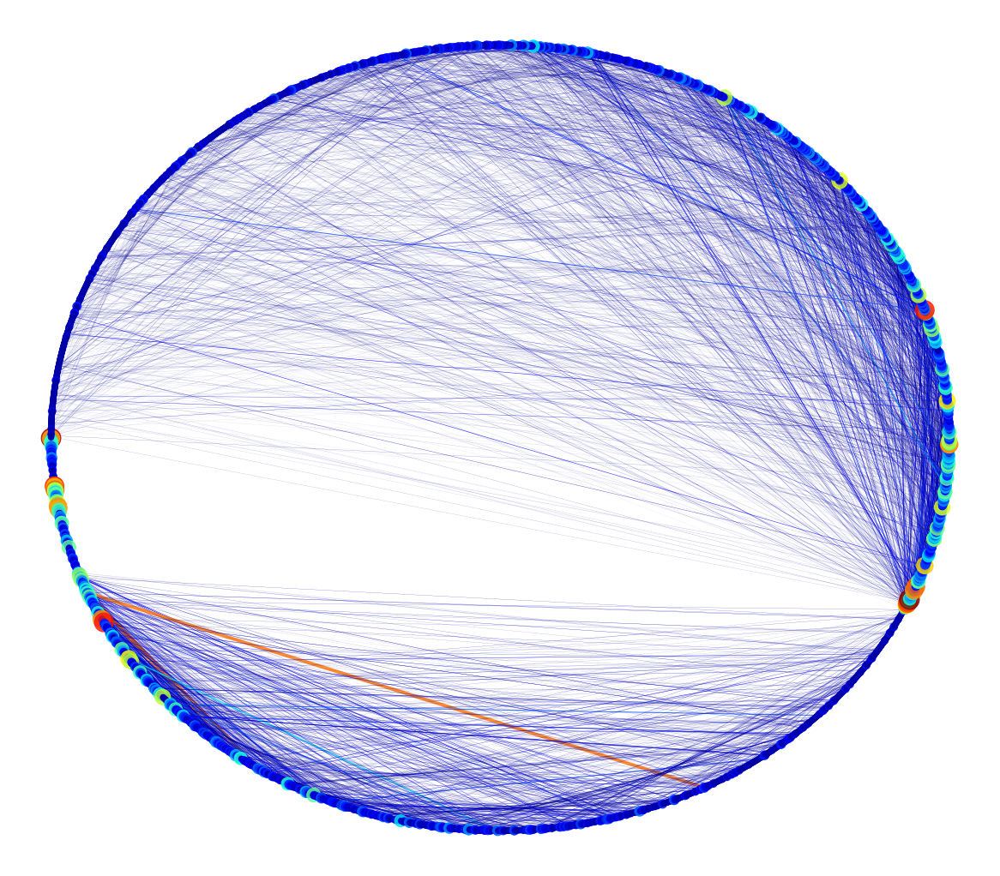

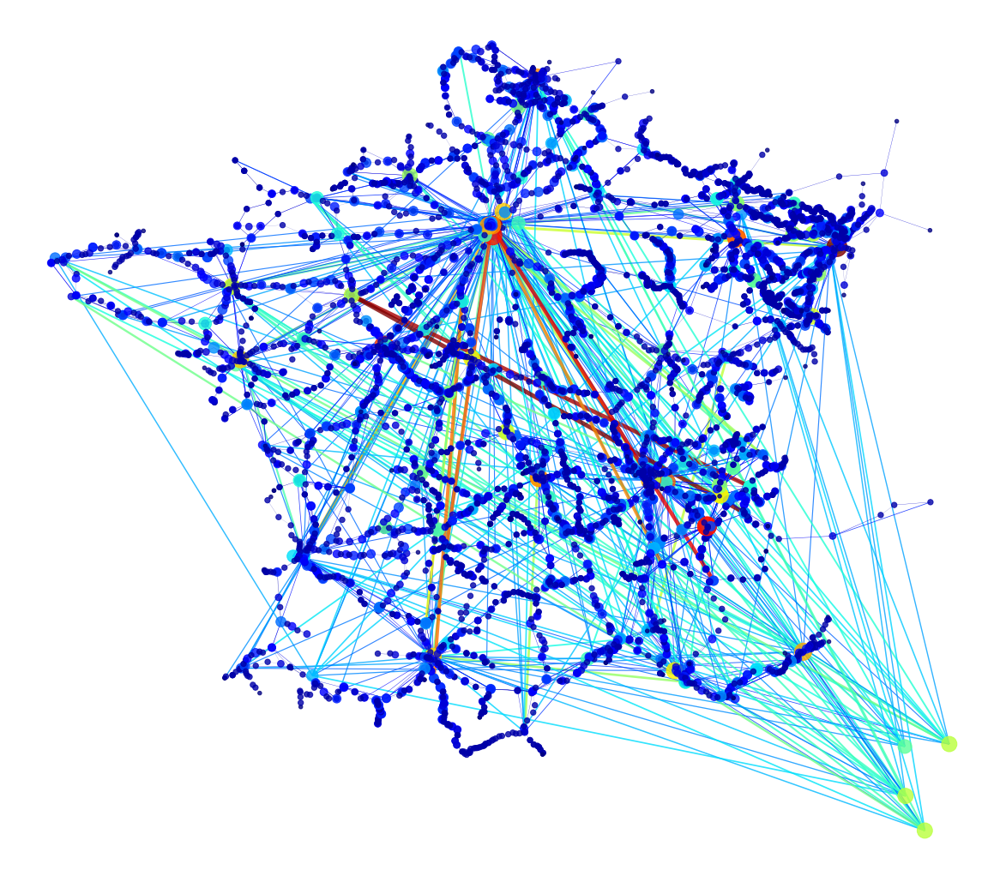

CPU times: user 11 s, sys: 354 ms, total: 11.4 s
Wall time: 10.9 s


In [10]:
%%time 
G = merge_graph([G_bus, G_avions, G_tgv, G_intercites, G_ter])
G = put_weight(G)
plot_graph(G,size_node=0.2)